C:\Users\vishal kumar\AppData\Roaming\Python\Python312\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\vishal kumar\AppData\Roaming\Python\Python312\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Phase1 Ep1/5] Train L:1.4086 A:32.21% | Val   L:1.2519 A:47.70%
[Phase1 Ep2/5] Train L:1.1498 A:47.12% | Val   L:1.0944 A:48.43%
[Phase1 Ep3/5] Train L:1.0931 A:50.60% | Val   L:1.1763 A:49.39%
[Phase1 Ep4/5] Train L:1.0162 A:52.21% | Val   L:1.1184 A:51.82%
[Phase1 Ep5/5] Train L:0.9520 A:54.96% | Val   L:1.0477 A:53.75%
[Phase2 Ep1/25] Train L:1.0337 A:51.64% | Val   L:1.1549 A:47.94%
[Phase2 Ep2/25] Train L:1.0416 A:50.96% | Val   L:1.0530 A:51.57%
[Phase2 Ep3/25] Train L:0.9405 A:57.35% | Val   L:1.0430 A:56.17%
[Phase2 Ep4/25] Train L:0.9183 A:56.42% | Val   L:1.1617 A:51.33%
[Phase2 Ep5/25] Train L:0.8167 A:61.82% | Val   L:0.9452 A:54.48%
[Phase2 Ep6/25] Train L:0.8083 A:61.35% | Val   L:1.0534 A:53.75%
[Phase2 Ep7/25] Train L:0.7092 A:66.49% | Val   L:1.0521 A:57.14%
[Phase2 Ep8/25] Train L:0.6689 A:69.04% | Val   L:1.0182 A:66.59%
[Phase2 Ep9/25] Train L:0.6626 A:68.88% | Val   L:0.9312 A:63.20%
[Phase2 Ep10/25] Train L:0.5899 A:70.65% | Val   L:1.1019 A:59.56%
[Phase2 Ep11/2

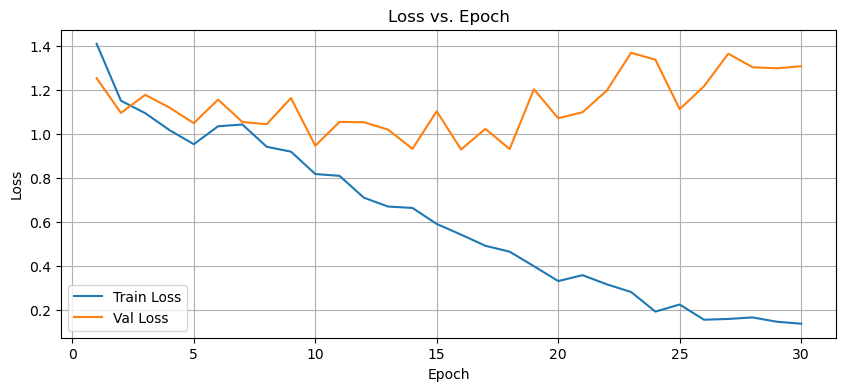

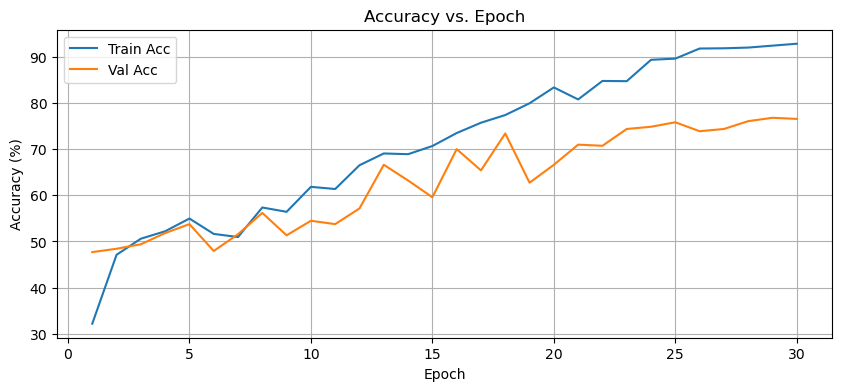

C:\Users\vishal kumar\AppData\Roaming\Python\Python312\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Validation Accuracy: 74.58%

                precision    recall  f1-score   support

       Healthy       0.96      0.99      0.98       150
       Mild DR       0.61      0.71      0.66        55
   Moderate DR       0.76      0.67      0.71       135
Proliferate DR       0.45      0.45      0.45        44
     Severe DR       0.32      0.34      0.33        29

      accuracy                           0.75       413
     macro avg       0.62      0.63      0.63       413
  weighted avg       0.75      0.75      0.75       413



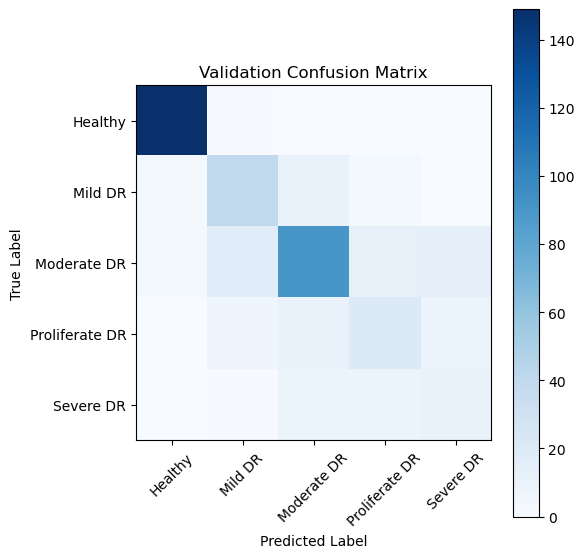

Sample classified as: Severe DR


C:\Users\vishal kumar\AppData\Roaming\Python\Python312\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\vishal kumar\AppData\Roaming\Python\Python312\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


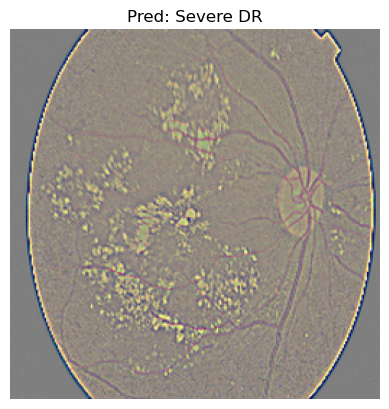

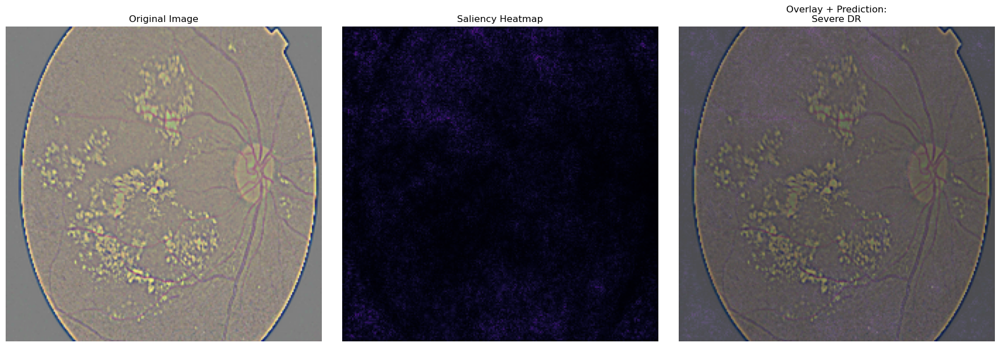

C:\Users\vishal kumar\AppData\Roaming\Python\Python312\site-packages\torch\nn\modules\module.py:1830: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


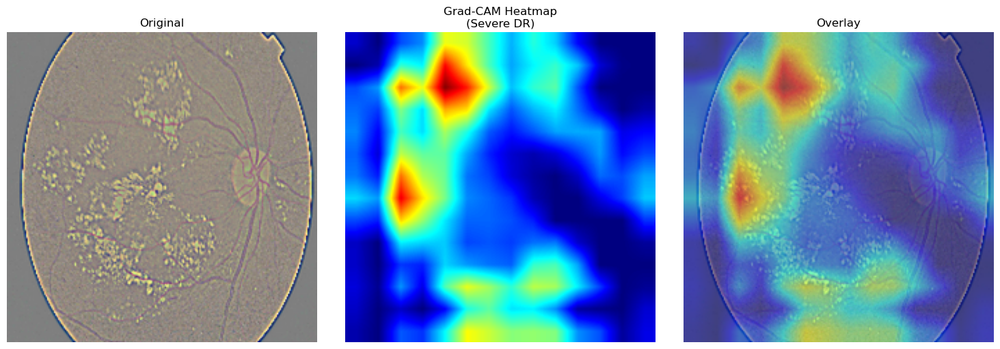

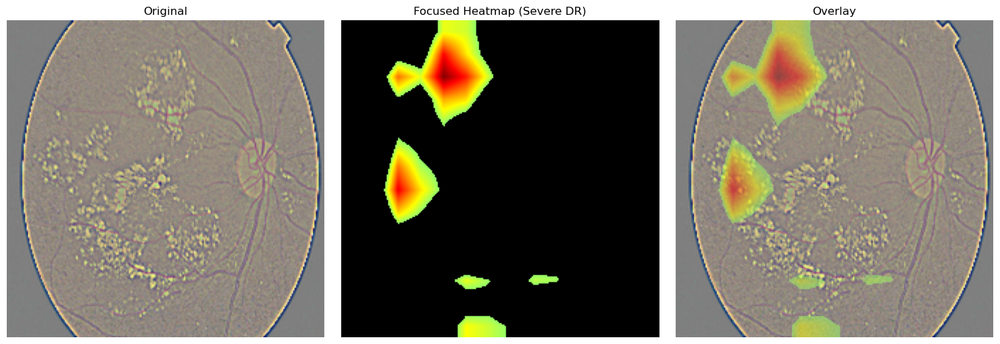

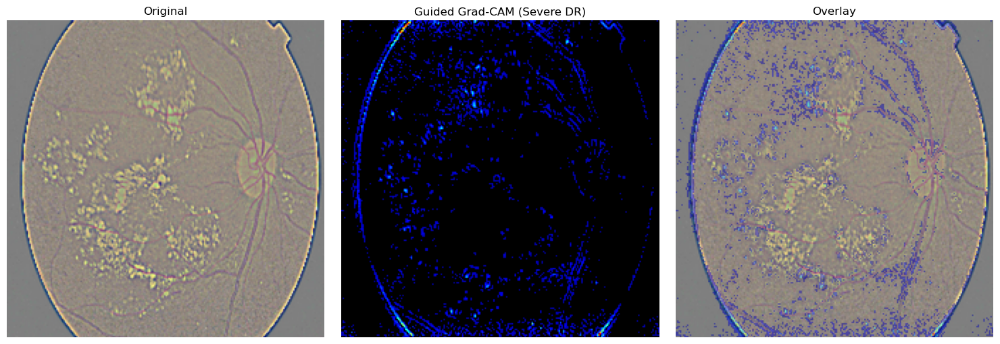

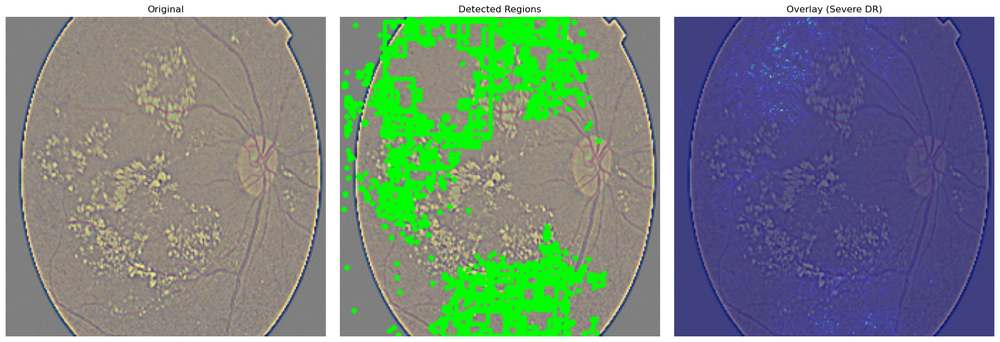

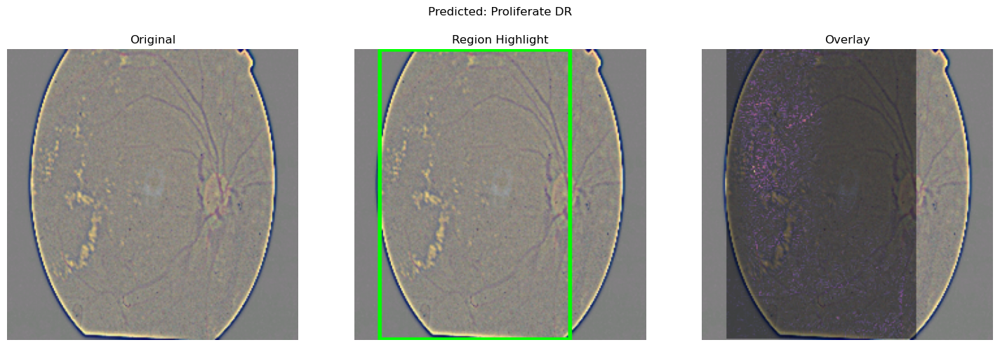

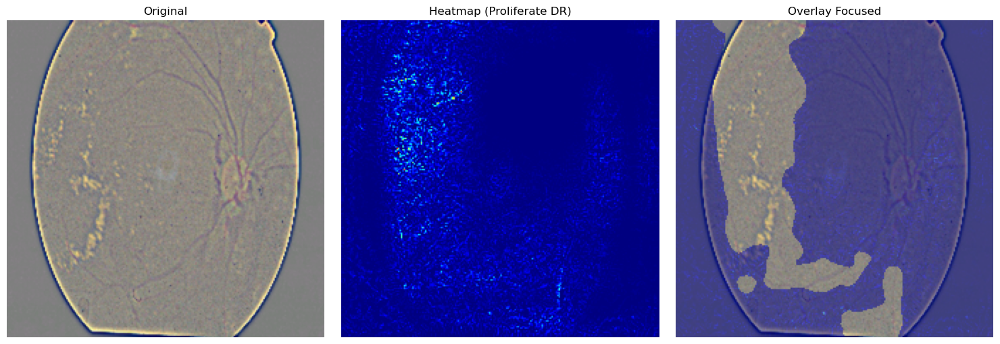

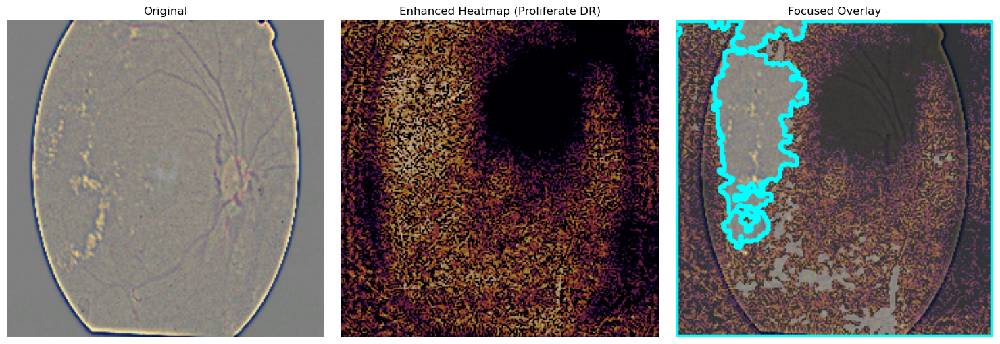

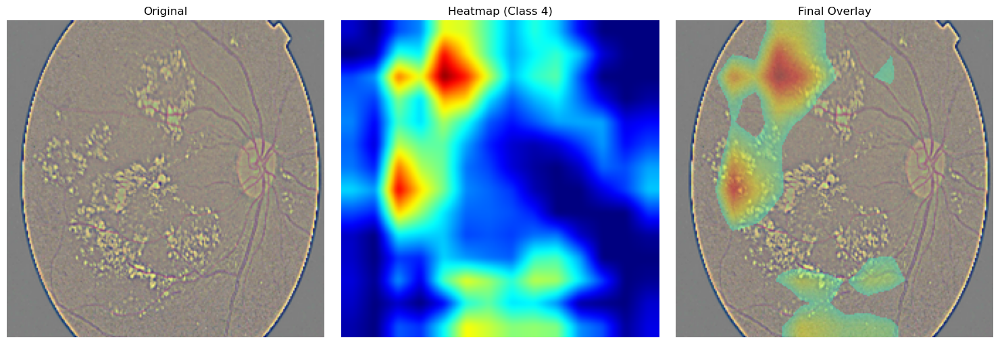

In [1]:
#with necessary graphs
# necessary graphs added
# ─── Cell 1: Setup, Data & Two-Phase Fine-Tuning with Metrics and Plots ─────

import os
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms, datasets, models
from torch.utils.data import DataLoader, Subset, WeightedRandomSampler
from sklearn.model_selection import StratifiedShuffleSplit
from collections import Counter
from torch.utils.tensorboard import SummaryWriter
import matplotlib.pyplot as plt

# 1) Config
data_dir       = r"C:\Users\vishal kumar\Desktop\dataset\diabetic retinopathy"
batch_size     = 8
phase1_epochs  = 5    # train only head
phase2_epochs  = 25   # fine-tune entire net
max_lr         = 1e-3
momentum       = 0.9
weight_decay   = 1e-4
device         = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 2) Transforms
IMG_SIZE = 224
mean = [0.485, 0.456, 0.406]
std  = [0.229, 0.224, 0.225]

train_tf = transforms.Compose([
    transforms.RandomResizedCrop(IMG_SIZE, scale=(0.8,1.0)),
    transforms.RandomHorizontalFlip(),
    transforms.ColorJitter(0.2,0.2,0.2,0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean, std)
])
eval_tf = transforms.Compose([
    transforms.Resize((IMG_SIZE,IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean, std)
])

# 3) Load & stratified split
full_ds = datasets.ImageFolder(data_dir)
indices, labels = list(range(len(full_ds))), full_ds.targets

sss1 = StratifiedShuffleSplit(1, test_size=0.30, random_state=42)
train_idx, temp_idx = next(sss1.split(indices, labels))
temp_labels = [labels[i] for i in temp_idx]
sss2 = StratifiedShuffleSplit(1, test_size=0.50, random_state=42)
val_rel, test_rel = next(sss2.split(temp_idx, temp_labels))
val_idx  = [temp_idx[i] for i in val_rel]
test_idx = [temp_idx[i] for i in test_rel]

# 4) Subsets + balanced sampler
ds_train = datasets.ImageFolder(data_dir, transform=train_tf)
ds_eval  = datasets.ImageFolder(data_dir, transform=eval_tf)
train_ds = Subset(ds_train, train_idx)
val_ds   = Subset(ds_eval,  val_idx)

train_labels = [labels[i] for i in train_idx]
counts       = Counter(train_labels)
class_wts    = [1.0/counts[i] for i in range(len(full_ds.classes))]
sample_wts   = [class_wts[l] for l in train_labels]
sampler      = WeightedRandomSampler(sample_wts, num_samples=len(sample_wts), replacement=True)

train_loader = DataLoader(train_ds, batch_size=batch_size, sampler=sampler, num_workers=4)
val_loader   = DataLoader(val_ds,   batch_size=batch_size, shuffle=False,   num_workers=4)

# 5) Model
model = models.vgg16(pretrained=True)
in_feats = model.classifier[6].in_features
model.classifier[6] = nn.Linear(in_feats, len(full_ds.classes))
model.to(device)

# 6) Criterion & writer
class_wts_tensor = torch.tensor(class_wts, device=device)
criterion        = nn.CrossEntropyLoss(weight=class_wts_tensor)
writer           = SummaryWriter(log_dir="runs/dr_two_phase")

# 7) Metrics storage
total_epochs = phase1_epochs + phase2_epochs
train_losses = []
val_losses   = []
train_accs   = []
val_accs     = []

# ── Phase 1: train only classifier head ──────────────────────────────────────
for p in model.features.parameters():
    p.requires_grad = False

optimizer = optim.SGD(model.parameters(), lr=max_lr, momentum=momentum, weight_decay=weight_decay)
sched1    = optim.lr_scheduler.OneCycleLR(optimizer, max_lr=max_lr,
               total_steps=phase1_epochs * len(train_loader),
               pct_start=0.3, div_factor=100, final_div_factor=100)

for epoch in range(phase1_epochs):
    # training
    model.train()
    rl=rc=rt=0
    for imgs, labs in train_loader:
        imgs, labs = imgs.to(device), labs.to(device)
        optimizer.zero_grad()
        out   = model(imgs)
        loss  = criterion(out, labs)
        loss.backward(); optimizer.step(); sched1.step()
        rl += loss.item()*imgs.size(0)
        preds = out.argmax(1)
        rc += (preds==labs).sum().item()
        rt += labs.size(0)
    train_loss = rl/rt; train_acc=rc/rt

    # validation
    model.eval()
    vl=vc=vt=0
    with torch.no_grad():
        for imgs, labs in val_loader:
            imgs, labs = imgs.to(device), labs.to(device)
            out   = model(imgs)
            loss  = criterion(out, labs)
            vl += loss.item()*imgs.size(0)
            preds= out.argmax(1)
            vc += (preds==labs).sum().item()
            vt += labs.size(0)
    val_loss = vl/vt; val_acc=vc/vt

    # log & store
    writer.add_scalar("Loss/train", train_loss,       epoch)
    writer.add_scalar("Loss/val",   val_loss,         epoch)
    writer.add_scalar("Acc/train",  train_acc*100,    epoch)
    writer.add_scalar("Acc/val",    val_acc*100,      epoch)

    train_losses.append(train_loss)
    val_losses.append(val_loss)
    train_accs.append(train_acc)
    val_accs.append(val_acc)

    print(f"[Phase1 Ep{epoch+1}/{phase1_epochs}] "
          f"Train L:{train_loss:.4f} A:{train_acc*100:.2f}% | "
          f"Val   L:{val_loss:.4f} A:{val_acc*100:.2f}%")

# ── Phase 2: fine-tune full network ─────────────────────────────────────────
for p in model.parameters():
    p.requires_grad = True

optimizer = optim.SGD(model.parameters(), lr=max_lr, momentum=momentum, weight_decay=weight_decay)
sched2    = optim.lr_scheduler.OneCycleLR(optimizer, max_lr=max_lr,
               total_steps=phase2_epochs * len(train_loader),
               pct_start=0.1, div_factor=100, final_div_factor=100)

for epoch in range(phase2_epochs):
    model.train()
    rl=rc=rt=0
    for imgs, labs in train_loader:
        imgs, labs = imgs.to(device), labs.to(device)
        optimizer.zero_grad()
        out   = model(imgs)
        loss  = criterion(out, labs)
        loss.backward(); optimizer.step(); sched2.step()
        rl += loss.item()*imgs.size(0)
        preds= out.argmax(1)
        rc += (preds==labs).sum().item()
        rt += labs.size(0)
    train_loss=train_acc= None
    train_loss = rl/rt; train_acc=rc/rt

    model.eval()
    vl=vc=vt=0
    with torch.no_grad():
        for imgs, labs in val_loader:
            imgs, labs = imgs.to(device), labs.to(device)
            out  = model(imgs)
            loss = criterion(out, labs)
            vl += loss.item()*imgs.size(0)
            preds= out.argmax(1)
            vc += (preds==labs).sum().item()
            vt += labs.size(0)
    val_loss=vl/vt; val_acc=vc/vt

    global_epoch = phase1_epochs + epoch
    writer.add_scalar("Loss/train", train_loss,    global_epoch)
    writer.add_scalar("Loss/val",   val_loss,      global_epoch)
    writer.add_scalar("Acc/train",  train_acc*100, global_epoch)
    writer.add_scalar("Acc/val",    val_acc*100,   global_epoch)

    train_losses.append(train_loss)
    val_losses.append(val_loss)
    train_accs.append(train_acc)
    val_accs.append(val_acc)

    print(f"[Phase2 Ep{epoch+1}/{phase2_epochs}] "
          f"Train L:{train_loss:.4f} A:{train_acc*100:.2f}% | "
          f"Val   L:{val_loss:.4f} A:{val_acc*100:.2f}%")

# close writer
writer.close()

# ── Plot Training & Validation Curves ───────────────────────────────────────
epochs = list(range(1, total_epochs+1))

plt.figure(figsize=(10,4))
plt.plot(epochs, train_losses, label='Train Loss')
plt.plot(epochs, val_losses,   label='Val Loss')
plt.xlabel('Epoch'); plt.ylabel('Loss')
plt.title('Loss vs. Epoch'); plt.legend(); plt.grid(True)
plt.show()

plt.figure(figsize=(10,4))
plt.plot(epochs, [a*100 for a in train_accs], label='Train Acc')
plt.plot(epochs, [a*100 for a in val_accs],   label='Val Acc')
plt.xlabel('Epoch'); plt.ylabel('Accuracy (%)')
plt.title('Accuracy vs. Epoch'); plt.legend(); plt.grid(True)
plt.show()




# ─── Cell 3: Evaluate, Plot Confusion Matrix & Sample Inference ────────────

import torch, numpy as np, matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
from PIL import Image
from torchvision import transforms, models

# 1) Reload model
model = models.vgg16(pretrained=False)
in_feats = model.classifier[6].in_features
model.classifier[6] = nn.Linear(in_feats, len(full_ds.classes))
model.load_state_dict(torch.load("dr_vgg16_final_finetuned2.pth", map_location=device))
model.to(device).eval()

# 2) Eval on validation set
all_preds, all_labels = [], []
with torch.no_grad():
    for imgs, labels in val_loader:
        imgs, labels = imgs.to(device), labels.to(device)
        out   = model(imgs)
        preds = out.argmax(1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

cm  = confusion_matrix(all_labels, all_preds)
acc = accuracy_score(all_labels, all_preds)
print(f"Validation Accuracy: {acc*100:.2f}%\n")
print(classification_report(all_labels, all_preds, target_names=full_ds.classes))

# 3) Plot confusion matrix
plt.figure(figsize=(6,6))
plt.imshow(cm, cmap=plt.cm.Blues, interpolation='nearest')
plt.title("Validation Confusion Matrix")
plt.colorbar()
ticks = np.arange(len(full_ds.classes))
plt.xticks(ticks, full_ds.classes, rotation=45)
plt.yticks(ticks, full_ds.classes)
plt.ylabel("True Label"); plt.xlabel("Predicted Label")
plt.tight_layout()
plt.show()

# 4) Sample inference helper
preprocess = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean, std)
])
def predict_and_show(path):
    img = Image.open(path).convert("RGB")
    x   = preprocess(img).unsqueeze(0).to(device)
    with torch.no_grad():
        pred = model(x).argmax(1).item()
    plt.imshow(img); plt.title(f"Pred: {full_ds.classes[pred]}"); plt.axis("off")
    return full_ds.classes[pred]

# Example usage:
sample_path = r"C:\Users\vishal kumar\Desktop\dataset\diabetic retinopathy\Severe DR\Severe DR_5.png"
print("Sample classified as:", predict_and_show(sample_path))

import cv2
import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
from torchvision import transforms, models
from PIL import Image

# ── CONFIGURATION ───────────────────────────────────────────────────────────────
DEVICE      = torch.device("cuda" if torch.cuda.is_available() else "cpu")
IMG_SIZE    = 224
MEAN        = [0.485, 0.456, 0.406]
STD         = [0.229, 0.224, 0.225]
CLASS_NAMES = ['Healthy', 'Mild DR', 'Moderate DR', 'Proliferate DR', 'Severe DR']
MODEL_PATH  = "vgg16_best_model.pth"

# ── PREPROCESSOR ────────────────────────────────────────────────────────────────
preprocess = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(MEAN, STD)
])

# ── MODEL BUILD & LOAD ──────────────────────────────────────────────────────────
model = models.vgg16(pretrained=False)
model.classifier = nn.Sequential(
    nn.Linear(25088, 4096),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(4096, 1024),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(1024, len(CLASS_NAMES))
)
model.load_state_dict(torch.load(MODEL_PATH, map_location=DEVICE))
model.to(DEVICE).eval()

# ── FUNCTION TO SHOW ORIGINAL, HEATMAP, AND OVERLAY ─────────────────────────────
def show_three_views(img_path, alpha=0.4, colormap=cv2.COLORMAP_MAGMA, gamma=0.7):
    # Load original image
    orig_pil = Image.open(img_path).convert("RGB")
    orig_np  = np.array(orig_pil.resize((IMG_SIZE, IMG_SIZE)))
    
    # Preprocess & run forward + backward for saliency
    inp = preprocess(orig_pil).unsqueeze(0).to(DEVICE).requires_grad_(True)
    model.zero_grad()
    logits = model(inp)
    pred   = logits.argmax(dim=1).item()
    score  = logits[0, pred]
    score.backward()
    
    # Compute saliency map
    sal = inp.grad.data.abs().squeeze().cpu()      # 3×H×W
    sal, _ = torch.max(sal, dim=0)                # H×W
    sal = sal.numpy() ** gamma                    # reduce contrast
    
    # Create heatmap
    sal_uint8 = (sal * 255).astype(np.uint8)
    heatmap   = cv2.applyColorMap(sal_uint8, colormap)  # H×W×3 BGR
    heatmap   = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    
    # Overlay heatmap on original
    overlay = cv2.addWeighted(heatmap, alpha, orig_np, 1 - alpha, 0)
    
    # Plot side-by-side
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    
    # Original
    axes[0].imshow(orig_np)
    axes[0].set_title("Original Image")
    axes[0].axis("off")
    
    # Heatmap only
    axes[1].imshow(heatmap)
    axes[1].set_title("Saliency Heatmap")
    axes[1].axis("off")
    
    # Overlay + predicted class
    axes[2].imshow(overlay)
    axes[2].set_title(f"Overlay + Prediction:\n{CLASS_NAMES[pred]}")
    axes[2].axis("off")
    
    plt.tight_layout()
    plt.show()

# ── USAGE ───────────────────────────────────────────────────────────────────────
if __name__ == "__main__":
    sample_img = r"C:\Users\vishal kumar\Desktop\dataset\diabetic retinopathy\Severe DR\Severe DR_5.png"
    show_three_views(sample_img)


import torch
import torch.nn as nn
from torchvision import models, transforms
from PIL import Image
import numpy as np
import cv2
import matplotlib.pyplot as plt

# ── CONFIG ─────────────────────────────────────────────────────────────────────
MODEL_PATH  = "vgg16_best_model.pth"
CLASS_NAMES = ['Healthy', 'Mild DR', 'Moderate DR', 'Proliferate DR', 'Severe DR']
IMG_SIZE    = 224
DEVICE      = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ── PREPROCESS ─────────────────────────────────────────────────────────────────
preprocess = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

# ── MODEL BUILD & LOAD ──────────────────────────────────────────────────────────
model = models.vgg16(pretrained=False)
model.classifier = nn.Sequential(
    nn.Linear(25088, 4096),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(4096, 1024),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(1024, len(CLASS_NAMES))
)
model.load_state_dict(torch.load(MODEL_PATH, map_location=DEVICE))
model.to(DEVICE).eval()

# ── HOOKS FOR ACTIVATIONS & GRADIENTS ───────────────────────────────────────────
activations = None
gradients   = None

def forward_hook(module, input, output):
    global activations
    activations = output.detach()

def backward_hook(module, grad_input, grad_output):
    global gradients
    gradients = grad_output[0].detach()

# Register hooks on the last convolutional layer (conv5_3)
target_layer = model.features[28]
target_layer.register_forward_hook(forward_hook)
target_layer.register_backward_hook(backward_hook)

# ── GRAD-CAM GENERATION ─────────────────────────────────────────────────────────
def generate_gradcam(img_path, class_idx=None, colormap=cv2.COLORMAP_JET):
    # 1) Load image
    img = Image.open(img_path).convert("RGB")
    inp = preprocess(img).unsqueeze(0).to(DEVICE)
    
    # 2) Forward pass
    logits = model(inp)
    if class_idx is None:
        class_idx = logits.argmax(dim=1).item()
    score = logits[0, class_idx]
    
    # 3) Backward pass to get gradients
    model.zero_grad()
    score.backward()
    
    # 4) Compute weights: global average pool of gradients
    weights = gradients.mean(dim=(2, 3), keepdim=True)  # 1×C×1×1
    
    # 5) Weighted combination of activations
    cam = (weights * activations).sum(dim=1, keepdim=True)  # 1×1×H×W
    cam = nn.ReLU()(cam)                                     # ReLU
    cam = cam.squeeze().cpu().numpy()
    
    # 6) Normalize CAM to [0,1]
    cam -= cam.min()
    cam /= cam.max()
    
    # 7) Resize CAM to original image size
    cam_resized = cv2.resize(cam, (IMG_SIZE, IMG_SIZE))
    heatmap     = (cam_resized * 255).astype(np.uint8)
    heatmap     = cv2.applyColorMap(heatmap, colormap)
    heatmap     = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    
    # 8) Overlay heatmap on original image
    orig_np  = np.array(img.resize((IMG_SIZE, IMG_SIZE)))
    overlay  = cv2.addWeighted(heatmap, 0.5, orig_np, 0.5, 0)
    
    return orig_np, heatmap, overlay, class_idx

# ── VISUALIZE RESULTS ───────────────────────────────────────────────────────────
def show_gradcam(img_path):
    orig, heatmap, overlay, cls = generate_gradcam(img_path)
    
    plt.figure(figsize=(15,5))
    titles = ["Original", f"Grad-CAM Heatmap\n({CLASS_NAMES[cls]})", "Overlay"]
    images = [orig, heatmap, overlay]
    
    for i, (img, title) in enumerate(zip(images, titles), 1):
        ax = plt.subplot(1, 3, i)
        ax.imshow(img)
        ax.set_title(title)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

# ── USAGE ───────────────────────────────────────────────────────────────────────
if __name__ == "__main__":
    sample_image = r"C:\Users\vishal kumar\Desktop\dataset\diabetic retinopathy\Severe DR\Severe DR_5.png"
    show_gradcam(sample_image)




import torch
import torch.nn as nn
from torchvision import models, transforms
from PIL import Image
import numpy as np
import cv2
import matplotlib.pyplot as plt

# ── CONFIG ─────────────────────────────────────────────────────────────────────
MODEL_PATH  = "vgg16_best_model.pth"
CLASS_NAMES = ['Healthy', 'Mild DR', 'Moderate DR', 'Proliferate DR', 'Severe DR']
IMG_SIZE    = 224
DEVICE      = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ── PREPROCESS ─────────────────────────────────────────────────────────────────
preprocess = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

# ── MODEL BUILD & LOAD ──────────────────────────────────────────────────────────
model = models.vgg16(pretrained=False)
model.classifier = nn.Sequential(
    nn.Linear(25088, 4096),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(4096, 1024),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(1024, len(CLASS_NAMES))
)
model.load_state_dict(torch.load(MODEL_PATH, map_location=DEVICE))
model.to(DEVICE).eval()

# ── HOOKS FOR ACTIVATIONS & GRADIENTS ───────────────────────────────────────────
activations = None
gradients   = None

def forward_hook(module, input, output):
    global activations
    activations = output.detach()

def backward_hook(module, grad_input, grad_output):
    global gradients
    gradients = grad_output[0].detach()

# Attach hooks to last conv layer
target_layer = model.features[28]
target_layer.register_forward_hook(forward_hook)
target_layer.register_backward_hook(backward_hook)

# ── FOCUSED GRAD-CAM ────────────────────────────────────────────────────────────
def generate_gradcam_focus(img_path, class_idx=None, colormap=cv2.COLORMAP_JET, threshold_percentile=90):
    # Load and preprocess
    img = Image.open(img_path).convert("RGB")
    inp = preprocess(img).unsqueeze(0).to(DEVICE)

    # Forward
    logits = model(inp)
    if class_idx is None:
        class_idx = logits.argmax(dim=1).item()
    score = logits[0, class_idx]

    # Backward
    model.zero_grad()
    score.backward()

    # Weights: global average of gradients
    weights = gradients.mean(dim=(2, 3), keepdim=True)
    # Weighted sum of activations
    cam = (weights * activations).sum(dim=1).squeeze().cpu().numpy()

    # Normalize
    cam = np.maximum(cam, 0)
    cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
    cam_resized = cv2.resize(cam, (IMG_SIZE, IMG_SIZE))

    # Threshold to focus on top region
    thresh_val = np.percentile(cam_resized, threshold_percentile)
    mask = cam_resized >= thresh_val  # boolean mask H×W

    # Create heatmap and mask it
    heatmap = (cam_resized * 255).astype(np.uint8)
    heatmap = cv2.applyColorMap(heatmap, colormap)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    heatmap_masked = np.zeros_like(heatmap)
    heatmap_masked[mask] = heatmap[mask]

    # Overlay only masked region
    orig_np = np.array(img.resize((IMG_SIZE, IMG_SIZE)))
    overlay = orig_np.copy()
    blended = cv2.addWeighted(orig_np, 0.5, heatmap, 0.5, 0)
    overlay[mask] = blended[mask]

    return orig_np, heatmap_masked, overlay, class_idx

# ── DISPLAY ─────────────────────────────────────────────────────────────────────
def show_gradcam_focus(img_path):
    orig, heatmap, overlay, cls = generate_gradcam_focus(img_path)
    plt.figure(figsize=(15,5))
    titles = ["Original", f"Focused Heatmap ({CLASS_NAMES[cls]})", "Overlay"]
    for i, (img, title) in enumerate(zip([orig, heatmap, overlay], titles), 1):
        ax = plt.subplot(1, 3, i)
        ax.imshow(img)
        ax.set_title(title)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

# ── USAGE ───────────────────────────────────────────────────────────────────────
if __name__ == "__main__":
    sample_image = r"C:\Users\vishal kumar\Desktop\dataset\diabetic retinopathy\Severe DR\Severe DR_5.png"
    show_gradcam_focus(sample_image)


import torch
import torch.nn as nn
from torchvision import models, transforms
from PIL import Image
import numpy as np
import cv2
import matplotlib.pyplot as plt

# ── CONFIGURATION ───────────────────────────────────────────────────────────────
MODEL_PATH  = "vgg16_best_model.pth"
CLASS_NAMES = ['Healthy', 'Mild DR', 'Moderate DR', 'Proliferate DR', 'Severe DR']
IMG_SIZE    = 224
DEVICE      = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ── PREPROCESSOR ─────────────────────────────────────────────────────────────────
preprocess = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# ── MODEL BUILD & LOAD ────────────────────────────────────────────────────────────
model = models.vgg16(pretrained=False)
model.classifier = nn.Sequential(
    nn.Linear(25088, 4096), nn.ReLU(), nn.Dropout(0.5),
    nn.Linear(4096, 1024), nn.ReLU(), nn.Dropout(0.5),
    nn.Linear(1024, len(CLASS_NAMES))
)
model.load_state_dict(torch.load(MODEL_PATH, map_location=DEVICE))
model.to(DEVICE).eval()

# ── HOOKS FOR ACTIVATIONS & GRADIENTS ────────────────────────────────────────────
activations = None
gradients   = None

def forward_hook(module, input, output):
    global activations
    activations = output.detach()

def backward_hook(module, grad_in, grad_out):
    global gradients
    gradients = grad_out[0].detach()

# Attach hooks to last conv layer
target_layer = model.features[28]
target_layer.register_forward_hook(forward_hook)
target_layer.register_backward_hook(backward_hook)

# ── GUIDED BACKPROP AGGREGATE HOOK ────────────────────────────────────────────────
def guided_backprop_relu_hook(module, grad_in, grad_out):
    # Only allow positive gradients
    return (torch.clamp(grad_in[0], min=0.0),)

# Register guided backprop on all ReLU
for module in model.modules():
    if isinstance(module, nn.ReLU):
        module.register_backward_hook(guided_backprop_relu_hook)

# ── GENERATE GUIDED GRAD-CAM ───────────────────────────────────────────────────────
def generate_guided_gradcam(
    img_path,
    alpha: float = 0.5,
    colormap = cv2.COLORMAP_JET,
    percentile: float = 90.0
):
    # Load and preprocess image
    img_pil = Image.open(img_path).convert("RGB")
    inp     = preprocess(img_pil).unsqueeze(0).to(DEVICE)
    inp.requires_grad = True

    # Forward pass
    output = model(inp)
    class_idx = output.argmax(dim=1).item()

    # 1) Grad-CAM: get activations+gradients
    model.zero_grad()
    score = output[0, class_idx]
    score.backward(retain_graph=True)
    # Compute weights & CAM
    weights = gradients.mean(dim=(2,3), keepdim=True)
    cam = (weights * activations).sum(dim=1).squeeze().cpu().numpy()
    cam = np.maximum(cam, 0)
    cam = (cam - cam.min())/(cam.max()-cam.min()+1e-8)
    cam_resized = cv2.resize(cam, (IMG_SIZE, IMG_SIZE))

    # 2) Guided Backprop: gradient wrt input
    model.zero_grad()
    output = model(inp)
    guided_score = output[0, class_idx]
    guided_score.backward()
    guided_grad = inp.grad.cpu().squeeze().numpy()
    guided_grad = np.maximum(guided_grad, 0)
    guided_grad = np.max(guided_grad, axis=0)
    guided_grad = (guided_grad - guided_grad.min())/(guided_grad.max()-guided_grad.min()+1e-8)

    # 3) Fuse
    guided_cam = cam_resized * guided_grad
    guided_cam = (guided_cam - guided_cam.min())/(guided_cam.max()-guided_cam.min()+1e-8)

    # 4) Focus region
    mask = guided_cam >= np.percentile(guided_cam, percentile)

    # 5) Make heatmap
    heat = (guided_cam * 255).astype(np.uint8)
    heatmap = cv2.applyColorMap(heat, colormap)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    heatmap_focused = np.zeros_like(heatmap)
    heatmap_focused[mask] = heatmap[mask]

    # 6) Overlay
    orig = np.array(img_pil.resize((IMG_SIZE, IMG_SIZE)))
    blended = cv2.addWeighted(orig, 1-alpha, heatmap, alpha, 0)
    overlay = orig.copy()
    overlay[mask] = blended[mask]

    return orig, heatmap_focused, overlay, class_idx

# ── DISPLAY ─────────────────────────────────────────────────────────────────────
def show_guided_gradcam(img_path):
    orig, heat, overlay, idx = generate_guided_gradcam(img_path)
    plt.figure(figsize=(15,5))
    titles = ["Original", f"Guided Grad-CAM ({CLASS_NAMES[idx]})", "Overlay"]
    for i, img in enumerate([orig, heat, overlay]):
        ax = plt.subplot(1,3,i+1)
        ax.imshow(img)
        ax.set_title(titles[i])
        ax.axis('off')
    plt.tight_layout()
    plt.show()

# ── USAGE EXAMPLE ───────────────────────────────────────────────────────────────
if __name__ == "__main__":
    sample = r"C:\Users\vishal kumar\Desktop\dataset\diabetic retinopathy\Severe DR\Severe DR_5.png"
    show_guided_gradcam(sample)


import torch
import torch.nn as nn
from torchvision import models, transforms
from PIL import Image
import numpy as np
import cv2
import matplotlib.pyplot as plt

# ── CONFIGURATION ───────────────────────────────────────────────────────────────
MODEL_PATH  = "vgg16_best_model.pth"
CLASS_NAMES = ['Healthy', 'Mild DR', 'Moderate DR', 'Proliferate DR', 'Severe DR']
IMG_SIZE    = 224
DEVICE      = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ── PREPROCESSOR ─────────────────────────────────────────────────────────────────
preprocess = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# ── MODEL BUILD & LOAD ────────────────────────────────────────────────────────────
model = models.vgg16(pretrained=False)
model.classifier = nn.Sequential(
    nn.Linear(25088, 4096), nn.ReLU(), nn.Dropout(0.5),
    nn.Linear(4096, 1024), nn.ReLU(), nn.Dropout(0.5),
    nn.Linear(1024, len(CLASS_NAMES))
)
model.load_state_dict(torch.load(MODEL_PATH, map_location=DEVICE))
model.to(DEVICE).eval()

# ── HOOKS FOR ACTIVATIONS & GRADIENTS ────────────────────────────────────────────
activations = None
gradients   = None

def forward_hook(module, input, output):
    global activations
    activations = output.detach()

def backward_hook(module, grad_in, grad_out):
    global gradients
    gradients = grad_out[0].detach()

target_layer = model.features[28]
target_layer.register_forward_hook(forward_hook)
target_layer.register_backward_hook(backward_hook)

# ── GENERATE GRAD-CAM & GUIDED BACKPROP ──────────────────────────────────────────
def compute_saliency_maps(img_path, percentile=90):
    # Load image
    img_pil = Image.open(img_path).convert("RGB")
    inp = preprocess(img_pil).unsqueeze(0).to(DEVICE)
    inp.requires_grad = True

    # Forward pass
    output = model(inp)
    class_idx = output.argmax(dim=1).item()
    score = output[0, class_idx]

    # Backward for Grad-CAM
    model.zero_grad()
    score.backward(retain_graph=True)
    weights = gradients.mean(dim=(2,3), keepdim=True)
    cam = (weights * activations).sum(dim=1).squeeze().cpu().numpy()
    cam = np.maximum(cam, 0)
    cam = (cam - cam.min())/(cam.max()-cam.min()+1e-8)
    cam = cv2.resize(cam, (IMG_SIZE, IMG_SIZE))

    # Guided Backprop gradients
    model.zero_grad()
    guided_score = output[0, class_idx]
    guided_score.backward()
    guided_grad = inp.grad.cpu().squeeze().numpy()
    guided_grad = np.maximum(guided_grad, 0)
    guided_grad = np.max(guided_grad, axis=0)
    guided_grad = (guided_grad - guided_grad.min())/(guided_grad.max()-guided_grad.min()+1e-8)

    # Fuse maps
    guided_cam = cam * guided_grad

    # Threshold map
    thresh = np.percentile(guided_cam, percentile)
    mask = guided_cam >= thresh

    return img_pil, cam, guided_cam, mask, class_idx

# ── DISPLAY RESULTS WITH BOUNDING BOXES ──────────────────────────────────────────
def show_saliency_boxes(img_path, percentile=90, alpha=0.5, colormap=cv2.COLORMAP_JET):
    img_pil, cam, guided_cam, mask, idx = compute_saliency_maps(img_path, percentile)
    orig = np.array(img_pil.resize((IMG_SIZE, IMG_SIZE)))

    # Create heatmap overlay
    heat = (guided_cam * 255).astype(np.uint8)
    heatmap = cv2.applyColorMap(heat, colormap)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    overlay = cv2.addWeighted(orig, 1-alpha, heatmap, alpha, 0)

    # Find contours on mask
    mask_uint8 = (mask.astype(np.uint8))*255
    contours, _ = cv2.findContours(mask_uint8, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Draw bounding boxes
    bbox_img = orig.copy()
    for cnt in contours:
        x, y, w, h = cv2.boundingRect(cnt)
        cv2.rectangle(bbox_img, (x, y), (x+w, y+h), (0, 255, 0), 2)

    # Plot: Original, Boxes, Overlay
    plt.figure(figsize=(18,6))
    titles = ["Original", f"Detected Regions", f"Overlay ({CLASS_NAMES[idx]})"]
    images = [orig, bbox_img, overlay]

    for i, (im, t) in enumerate(zip(images, titles), 1):
        ax = plt.subplot(1,3,i)
        ax.imshow(im)
        ax.set_title(t)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

# ── USAGE ───────────────────────────────────────────────────────────────────────
if __name__ == "__main__":
    sample = r"C:\Users\vishal kumar\Desktop\dataset\diabetic retinopathy\Severe DR\Severe DR_5.png"
    show_saliency_boxes(sample)


import os
import torch
import torch.nn as nn
from torchvision import models, transforms
from PIL import Image
import numpy as np
import cv2
import matplotlib.pyplot as plt

# ── CONFIGURATION ───────────────────────────────────────────────────────────────
MODEL_PATH = "vgg16_best_model.pth"  # Your trained model
CLASS_NAMES = ['Healthy', 'Mild DR', 'Moderate DR', 'Proliferate DR', 'Severe DR']
IMG_SIZE = 224
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ── PREPROCESSOR ─────────────────────────────────────────────────────────────────
preprocess = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# ── MODEL BUILD & LOAD ────────────────────────────────────────────────────────────
model = models.vgg16(pretrained=False)
model.classifier = nn.Sequential(
    nn.Linear(25088, 4096), nn.ReLU(), nn.Dropout(0.5),
    nn.Linear(4096, 1024), nn.ReLU(), nn.Dropout(0.5),
    nn.Linear(1024, len(CLASS_NAMES))
)
model.load_state_dict(torch.load(MODEL_PATH, map_location=DEVICE))
model.to(DEVICE).eval()

# ── HOOKS FOR ACTIVATIONS & GRADIENTS ────────────────────────────────────────────
activations = None
gradients = None

def forward_hook(module, input, output):
    global activations
    activations = output.detach()

def backward_hook(module, grad_in, grad_out):
    global gradients
    gradients = grad_out[0].detach()

target_layer = model.features[28]
target_layer.register_forward_hook(forward_hook)
target_layer.register_backward_hook(backward_hook)

# ── GENERATE FOCUSED GRAD-CAM REGION ─────────────────────────────────────────────
def generate_gradcam_region(img_path, percentile=90, pad=15):
    # Validate path
    if not os.path.isfile(img_path):
        raise FileNotFoundError(f"Image file not found: {img_path}")

    # Load and preprocess
    img_pil = Image.open(img_path).convert("RGB")
    inp = preprocess(img_pil).unsqueeze(0).to(DEVICE)
    inp.requires_grad = True

    # Forward + backward for Grad-CAM
    out = model(inp)
    cls_idx = int(out.argmax(dim=1).item())
    score = out[0, cls_idx]
    model.zero_grad()
    score.backward(retain_graph=True)

    # Compute CAM
    weights = gradients.mean(dim=(2,3), keepdim=True)
    cam = (weights * activations).sum(dim=1).squeeze().cpu().numpy()
    cam = np.clip(cam, 0, None)
    cam = (cam - cam.min())/(cam.max()-cam.min()+1e-8)
    cam = cv2.resize(cam, (IMG_SIZE, IMG_SIZE))

    # Guided Backprop for sharpened gradient
    model.zero_grad()
    score.backward()
    grad_input = inp.grad.cpu().squeeze().numpy()
    guided = np.clip(np.max(grad_input, axis=0), 0, None)
    guided = (guided - guided.min())/(guided.max()-guided.min()+1e-8)

    # Fuse CAM + guided backprop
    fused = cam * guided
    fused = (fused - fused.min())/(fused.max()-fused.min()+1e-8)

    # Smooth + threshold
    blurred = cv2.GaussianBlur((fused*255).astype(np.uint8), (9,9), 0)/255.0
    mask = blurred >= np.percentile(blurred, percentile)

    # Bounding box of salient region
    coords = np.column_stack(np.where(mask))
    if coords.size:
        y0, x0 = coords.min(axis=0)
        y1, x1 = coords.max(axis=0)
        x0, y0 = max(x0-pad, 0), max(y0-pad, 0)
        x1, y1 = min(x1+pad, IMG_SIZE-1), min(y1+pad, IMG_SIZE-1)
    else:
        x0, y0, x1, y1 = 0,0,IMG_SIZE-1,IMG_SIZE-1

    # Prepare visuals
    orig = np.array(img_pil.resize((IMG_SIZE, IMG_SIZE)))
    heat = (fused*255).astype(np.uint8)
    heatmap = cv2.applyColorMap(heat, cv2.COLORMAP_MAGMA)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)

    # Masked overlay only in region
    overlay = orig.copy()
    sub_orig = orig[y0:y1, x0:x1]
    sub_heat = heatmap[y0:y1, x0:x1]
    sub_blend = cv2.addWeighted(sub_orig, 0.5, sub_heat, 0.5, 0)
    overlay[y0:y1, x0:x1] = sub_blend

    # Highlight box on a copy
    boxed = orig.copy()
    cv2.rectangle(boxed, (x0,y0), (x1,y1), (0,255,0), 2)

    return orig, boxed, overlay, cls_idx

# ── SHOW RESULTS ─────────────────────────────────────────────────────────────────
def show_gradcam(img_path, percentile=90, pad=15):
    orig, boxed, overlay, idx = generate_gradcam_region(img_path, percentile, pad)
    plt.figure(figsize=(15,5))
    titles = ["Original", "Region Highlight", "Overlay"]
    for i,img in enumerate([orig, boxed, overlay],1):
        ax = plt.subplot(1,3,i)
        ax.imshow(img)
        ax.set_title(titles[i-1])
        ax.axis('off')
    plt.suptitle(f"Predicted: {CLASS_NAMES[idx]}")
    plt.tight_layout(rect=[0,0,1,0.95])
    plt.show()

# ── EXAMPLE USAGE ─────────────────────────────────────────────────────────────────
if __name__ == "__main__":
    # Replace with your actual image path on your system:
    sample_path = r"C:\Users\vishal kumar\Desktop\dataset\diabetic retinopathy\Proliferate DR\Proliferate DR_8.png"
    show_gradcam(sample_path, percentile=95, pad=10)


import os
import torch
import torch.nn as nn
from torchvision import models, transforms
from PIL import Image
import numpy as np
import cv2
import matplotlib.pyplot as plt

# ── CONFIGURATION ───────────────────────────────────────────────────────────────
MODEL_PATH = "vgg16_best_model.pth"  # Path to your trained model
CLASS_NAMES = ['Healthy', 'Mild DR', 'Moderate DR', 'Proliferate DR', 'Severe DR']
IMG_SIZE = 224
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ── PREPROCESSOR ─────────────────────────────────────────────────────────────────
preprocess = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# ── MODEL BUILD & LOAD ────────────────────────────────────────────────────────────
model = models.vgg16(pretrained=False)
model.classifier = nn.Sequential(
    nn.Linear(25088, 4096), nn.ReLU(), nn.Dropout(0.5),
    nn.Linear(4096, 1024), nn.ReLU(), nn.Dropout(0.5),
    nn.Linear(1024, len(CLASS_NAMES))
)
model.load_state_dict(torch.load(MODEL_PATH, map_location=DEVICE))
model.to(DEVICE).eval()

# ── HOOKS FOR ACTIVATIONS & GRADIENTS ────────────────────────────────────────────
activations = None
_gradients = None

def forward_hook(module, input, output):
    global activations
    activations = output.detach()

def backward_hook(module, grad_input, grad_output):
    global _gradients
    _gradients = grad_output[0].detach()

target_layer = model.features[28]
target_layer.register_forward_hook(forward_hook)
target_layer.register_backward_hook(backward_hook)

# ── UTILITY: LARGEST COMPONENT MASK ──────────────────────────────────────────────
def largest_component_mask(binary_mask):
    # Find largest connected component
    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(binary_mask.astype(np.uint8))
    if num_labels <= 1:
        return binary_mask
    # skip background at index 0
    sizes = stats[1:, cv2.CC_STAT_AREA]
    max_label = 1 + np.argmax(sizes)
    return (labels == max_label)

# ── GENERATE PRECISE FOCUSED GRADCAM ─────────────────────────────────────────────
def generate_precise_gradcam(img_path, blur_sigma=5):
    # Load image
    if not os.path.isfile(img_path):
        raise FileNotFoundError(f"Image not found: {img_path}")
    img = Image.open(img_path).convert("RGB")
    inp = preprocess(img).unsqueeze(0).to(DEVICE)
    inp.requires_grad_()

    # Forward
    out = model(inp)
    cls_idx = int(out.argmax(dim=1).item())
    score = out[0, cls_idx]

    # Backward: Grad-CAM
    model.zero_grad()
    score.backward(retain_graph=True)
    weights = _gradients.mean(dim=(2,3), keepdim=True)
    cam = (weights * activations).sum(dim=1).squeeze().cpu().numpy()
    cam = np.clip(cam, 0, None)
    cam = (cam - cam.min())/(cam.max()-cam.min()+1e-8)
    cam = cv2.resize(cam, (IMG_SIZE, IMG_SIZE))

    # Backward: Guided Backprop
    model.zero_grad()
    score.backward()
    grad_input = inp.grad.cpu().squeeze().numpy()
    guided = np.clip(np.max(grad_input, axis=0), 0, None)
    guided = (guided - guided.min())/(guided.max()-guided.min()+1e-8)

    # Fuse and smooth
    fused = cam * guided
    fused = (fused - fused.min())/(fused.max()-fused.min()+1e-8)
    fused_blur = cv2.GaussianBlur((fused*255).astype(np.uint8), (0,0), blur_sigma)/255.0

    # Otsu threshold for auto precise cutoff
    _, otsu_thresh = cv2.threshold((fused_blur*255).astype(np.uint8), 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    mask = fused_blur >= (otsu_thresh/255.0)
    mask = largest_component_mask(mask)

    # Create heatmap
    heat = (fused*255).astype(np.uint8)
    heatmap = cv2.applyColorMap(heat, cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)

    # Overlay only precise region
    orig = np.array(img.resize((IMG_SIZE, IMG_SIZE)))
    overlay = orig.copy()
    blended = cv2.addWeighted(orig, 0.5, heatmap, 0.5, 0)
    overlay[mask] = blended[mask]

    return orig, heatmap, overlay, cls_idx

# ── DISPLAY ORIGINAL, HEATMAP, OVERLAY ─────────────────────────────────────────
def show_gradcam(img_path, blur_sigma=5):
    orig, heatmap, overlay, idx = generate_precise_gradcam(img_path, blur_sigma)
    plt.figure(figsize=(15,5))
    for i, (img, title) in enumerate([
        (orig, "Original"),
        (heatmap, f"Heatmap ({CLASS_NAMES[idx]})"),
        (overlay, "Overlay Focused")
    ], start=1):
        ax = plt.subplot(1,3,i)
        ax.imshow(img)
        ax.set_title(title)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

# ── USAGE EXAMPLE ───────────────────────────────────────────────────────────────
if __name__ == "__main__":
    sample_path = r"C:\Users\vishal kumar\Desktop\dataset\diabetic retinopathy\Proliferate DR\Proliferate DR_8.png"
    show_gradcam(sample_path, blur_sigma=5)


import os
import torch
import torch.nn as nn
from torchvision import models, transforms
from PIL import Image
import numpy as np
import cv2
import matplotlib.pyplot as plt

# ── CONFIGURATION ───────────────────────────────────────────────────────────────
MODEL_PATH = "vgg16_best_model.pth"  # Path to your trained model
CLASS_NAMES = ['Healthy', 'Mild DR', 'Moderate DR', 'Proliferate DR', 'Severe DR']
IMG_SIZE = 224
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ── PREPROCESSOR ─────────────────────────────────────────────────────────────────
preprocess = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# ── MODEL BUILD & LOAD ────────────────────────────────────────────────────────────
model = models.vgg16(pretrained=False)
model.classifier = nn.Sequential(
    nn.Linear(25088, 4096), nn.ReLU(), nn.Dropout(0.5),
    nn.Linear(4096, 1024), nn.ReLU(), nn.Dropout(0.5),
    nn.Linear(1024, len(CLASS_NAMES))
)
model.load_state_dict(torch.load(MODEL_PATH, map_location=DEVICE))
model.to(DEVICE).eval()

# ── HOOKS FOR ACTIVATIONS & GRADIENTS ────────────────────────────────────────────
activations = None
_gradients = None

def forward_hook(module, input, output):
    global activations
    activations = output.detach()

def backward_hook(module, grad_input, grad_output):
    global _gradients
    _gradients = grad_output[0].detach()

target_layer = model.features[28]
target_layer.register_forward_hook(forward_hook)
target_layer.register_backward_hook(backward_hook)

# ── UTILITY: LARGEST COMPONENT MASK ──────────────────────────────────────────────
def largest_component_mask(binary_mask):
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(binary_mask.astype(np.uint8))
    if num_labels <= 1:
        return binary_mask
    sizes = stats[1:, cv2.CC_STAT_AREA]
    max_label = 1 + np.argmax(sizes)
    return (labels == max_label)

# ── GENERATE ENHANCED GRADCAM ─────────────────────────────────────────────────────
def generate_enhanced_gradcam(img_path, blur_sigma=7, colormap=cv2.COLORMAP_INFERNO, alpha=0.6):
    # Verify image path
    if not os.path.isfile(img_path):
        raise FileNotFoundError(f"Image not found: {img_path}")

    # Load + preprocess
    img_pil = Image.open(img_path).convert("RGB")
    orig = np.array(img_pil.resize((IMG_SIZE, IMG_SIZE)))
    inp = preprocess(img_pil).unsqueeze(0).to(DEVICE)
    inp.requires_grad_()

    # Forward and get predicted class
    output = model(inp)
    cls_idx = int(output.argmax(dim=1).item())
    score = output[0, cls_idx]

    # Grad-CAM backward
    model.zero_grad()
    score.backward(retain_graph=True)
    weights = _gradients.mean(dim=(2,3), keepdim=True)
    cam_map = (weights * activations).sum(dim=1).squeeze().cpu().numpy()
    cam_map = np.clip(cam_map, 0, None)
    cam_map = (cam_map - cam_map.min())/(cam_map.max()-cam_map.min()+1e-8)
    cam_map = cv2.resize(cam_map, (IMG_SIZE, IMG_SIZE))

    # Guided Backprop backward
    model.zero_grad()
    score.backward()
    grad_input = inp.grad.cpu().squeeze().numpy()
    guided_map = np.clip(np.max(grad_input, axis=0), 0, None)
    guided_map = (guided_map - guided_map.min())/(guided_map.max()-guided_map.min()+1e-8)

    # Fuse maps
    fused = cam_map * guided_map
    fused = (fused - fused.min())/(fused.max()-fused.min()+1e-8)

    # Smooth and threshold using Otsu
    blurred = cv2.GaussianBlur((fused*255).astype(np.uint8), (blur_sigma, blur_sigma), 0)
    _, otsu = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    mask = blurred >= otsu
    mask = largest_component_mask(mask)

    # Create color heatmap
    heat = cv2.applyColorMap((fused*255).astype(np.uint8), colormap)
    heat = cv2.cvtColor(heat, cv2.COLOR_BGR2RGB)

    # Enhance heatmap contrast
    heat_eq = cv2.equalizeHist(cv2.cvtColor(heat, cv2.COLOR_RGB2GRAY))
    heat_eq = cv2.applyColorMap(heat_eq, colormap)
    heat_eq = cv2.cvtColor(heat_eq, cv2.COLOR_BGR2RGB)
    heatmap = cv2.addWeighted(heat, 0.4, heat_eq, 0.6, 0)

    # Overlay only focused region with contour
    overlay = orig.copy()
    blended = cv2.addWeighted(orig, 1-alpha, heatmap, alpha, 0)
    overlay[mask] = blended[mask]

    # Draw contour around mask
    contours, _ = cv2.findContours(mask.astype(np.uint8)*255, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(overlay, contours, -1, (0, 255, 255), 2)

    return orig, heatmap, overlay, cls_idx

# ── DISPLAY ORIGINAL, HEATMAP, OVERLAY ─────────────────────────────────────────
def show_gradcam(img_path, blur_sigma=7, alpha=0.6):
    orig, heatmap, overlay, idx = generate_enhanced_gradcam(img_path, blur_sigma, cv2.COLORMAP_INFERNO, alpha)
    plt.figure(figsize=(15,5))
    for i, (img, title) in enumerate([
        (orig, "Original"),
        (heatmap, f"Enhanced Heatmap ({CLASS_NAMES[idx]})"),
        (overlay, "Focused Overlay")
    ], start=1):
        ax = plt.subplot(1,3,i)
        ax.imshow(img)
        ax.set_title(title)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

# ── USAGE EXAMPLE ───────────────────────────────────────────────────────────────
if __name__ == "__main__":
    sample_path = r"C:\Users\vishal kumar\Desktop\dataset\diabetic retinopathy\Proliferate DR\Proliferate DR_8.png"
    show_gradcam(sample_path)


import os
import torch
import torch.nn as nn
from torchvision import models, transforms
from PIL import Image
import numpy as np
import cv2
import matplotlib.pyplot as plt

# ── CONFIGURATION ───────────────────────────────────────────────────────────────
MODEL_PATH = "vgg16_best_model.pth"   # Update path if needed
IMG_SIZE = 224
COLORMAP = cv2.COLORMAP_JET
OVERLAY_ALPHA = 0.4

# ── MODEL LOADING & PREPROCESSING ───────────────────────────────────────────────
def load_model(model_path: str, num_classes: int = 5) -> nn.Module:
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = models.vgg16(pretrained=False)
    model.classifier = nn.Sequential(
        nn.Linear(25088, 4096), nn.ReLU(), nn.Dropout(0.5),
        nn.Linear(4096, 1024), nn.ReLU(), nn.Dropout(0.5),
        nn.Linear(1024, num_classes)
    )
    state = torch.load(model_path, map_location=device)
    model.load_state_dict(state)
    model.to(device).eval()
    return model

def preprocess_image(img_path: str, size: int = IMG_SIZE) -> (np.ndarray, torch.Tensor):
    # Load and resize original
    img = Image.open(img_path).convert("RGB")
    orig = np.array(img.resize((size, size)))
    # Preprocess for model
    tf = transforms.Compose([
        transforms.Resize((size, size)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])
    tensor = tf(img).unsqueeze(0)
    return orig, tensor

# ── GRAD-CAM UTILITIES ───────────────────────────────────────────────────────────
activations = {}
gradients = {}

def forward_hook(module, input, output):
    activations['val'] = output.detach()

def backward_hook(module, grad_in, grad_out):
    gradients['val'] = grad_out[0].detach()

# ── GENERATE ENHANCED GRAD-CAM ────────────────────────────────────────────────────
def generate_gradcam_enhanced(
    model: nn.Module,
    orig: np.ndarray,
    x: torch.Tensor,
    colormap: int = COLORMAP,
    overlay_alpha: float = OVERLAY_ALPHA
) -> (np.ndarray, np.ndarray, np.ndarray, int):
    device = next(model.parameters()).device
    x = x.to(device).requires_grad_(True)

    # Register hooks on last conv layer
    target_layer = model.features[28]
    handle_fw = target_layer.register_forward_hook(forward_hook)
    handle_bw = target_layer.register_backward_hook(backward_hook)

    # Forward
    logits = model(x)
    cls = int(logits.argmax(dim=1).item())
    score = logits[0, cls]

    # Backward
    model.zero_grad()
    score.backward()

    # Compute CAM
    act = activations['val']    # 1xCxHxW
    grad = gradients['val']     # same shape
    weights = grad.mean(dim=(2,3), keepdim=True)
    cam = (weights * act).sum(dim=1).squeeze().cpu().numpy()
    cam = np.maximum(cam, 0)
    cam /= (cam.max() + 1e-8)
    cam = cv2.resize(cam, (orig.shape[1], orig.shape[0]))

    # Remove hooks
    handle_fw.remove()
    handle_bw.remove()

    # Create colored heatmap
    heatmap = cv2.applyColorMap((cam * 255).astype(np.uint8), colormap)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    # Normalize dynamic range
    heatmap = cv2.normalize(heatmap, None, 0, 255, cv2.NORM_MINMAX)
    heatmap = cv2.GaussianBlur(heatmap, (7,7), 0)

    # Overlay full image lightly
    overlay_full = cv2.addWeighted(orig, 1 - overlay_alpha, heatmap, overlay_alpha, 0)

    # Create mask on top 20% of CAM
    thresh = np.percentile(cam, 80)
    mask = cam >= thresh

    # Final focused overlay: apply only masked region
    overlay = orig.copy()
    overlay[mask] = overlay_full[mask]

    return orig, heatmap, overlay, cls

# ── DISPLAY FUNCTION ─────────────────────────────────────────────────────────────
def show_gradcam(img_path: str, model_path: str = MODEL_PATH):
    # Load model and image
    model = load_model(model_path)
    orig, tensor = preprocess_image(img_path)

    # Generate Grad-CAM
    orig_img, heatmap, overlay, cls = generate_gradcam_enhanced(model, orig, tensor)

    # Plot results
    plt.figure(figsize=(15,5))
    titles = ["Original", f"Heatmap (Class {cls})", "Final Overlay"]
    for i, img in enumerate([orig_img, heatmap, overlay], start=1):
        ax = plt.subplot(1,3,i)
        ax.imshow(img)
        ax.set_title(titles[i-1])
        ax.axis('off')
    plt.tight_layout()
    plt.show()

# ── EXAMPLE USAGE ─────────────────────────────────────────────────────────────────
if __name__ == "__main__":
    # Provide the path to your image below
    sample_image = r"C:\Users\vishal kumar\Desktop\dataset\diabetic retinopathy\Severe DR\Severe DR_5.png"
    show_gradcam(sample_image)


In [2]:
# ─── Cell 2: Save the Fine-Tuned Model ───────────────────────────────────────

import torch
torch.save(model.state_dict(), "dr_vgg16_final_finetuned3.pth")
print("Model weights saved to dr_vgg16_final_finetuned3.pth")


Model weights saved to dr_vgg16_final_finetuned3.pth
